# B Product

<div>
    <img style='width: 220px;height: 100px;float: left;' src="../../Supplementary_data/EODC-Logo-Final.png" height='100px' width='220px'/>
    <img style='width: 200px;height: 100px;float: left;' src="../../Supplementary_data/BMNT_DE_Logo_dreizeilig_srgb.svg" height='100px' width='200px'/> 
    <img style='width: 200px;height: 100px;float: left;' src="../../Supplementary_data/bmlv.svg" height='100px' width='200px'/>
    <img style='width: 200px;height: 100px;float: left;' src="../../Supplementary_data/LOGO_TUW_GEO.png" height='100px' width='200px'/>
    <img style='width: 100px;height: 100px;float: left;' src="../../Supplementary_data/Boku-wien.svg" height='100px' width='100px'/>
    <img style='width: 150px;height: 100px;float: right;' src="../../Supplementary_data/ADC_Logo_final_transparent.png" height='100px' width='150px'/>
</div>

This notebook shows the B product created by BOKU. This product contains atmospherically-corrected Sentinel-2A and 2B data processed using the European Space Agency’s (ESA) Sen2Cor algorithm. The product is resampled to the Equi7 Grid, covers an area of 100 km x 100 km with a pixel sampling of 10 m. 

The product name in the ACube is `B_Sentinel_2`. It is composed of ten measurements `B02`, `B03`, `B04`, `B05`, `B06`, `B07`, `B08`, `B8A`, `B11` and `B12`.

Relevant links:
* https://austriandatacube.eodc.eu/xwiki/bin/view/2.%20Terminology/3.3.%20Datasets/3.4.2.%20Sentinel-2%20data/3.4.2.3.%20Products/
* https://austriandatacube.eodc.eu/xwiki/bin/view/2.%20Terminology/3.3.%20Datasets/3.4.2.%20Sentinel-2%20data/

## Exploring the product

The code below initialises the datacube and lists some metadata of the product, measurements and datasets. We can see that this product has two measurements and a spatial resolution of 10 m. We also list the metadata fields that are available.

In [1]:
import datacube
import xarray
from pprint import pprint
%matplotlib inline
dc = datacube.Datacube(app='sample_b')
product = 'B_Sentinel_2'

In [2]:
prodlist=dc.list_products().dropna(axis=1)
prodlist[prodlist['name'] == product]

,name,description,instrument,format,platform,product_type,crs,resolution,spatial_dimensions
id,,,,,,,,,
1,B_Sentinel_2,Atmospherically corrected Sentinel 2 bands,MSI,GeoTIFF,Sentinel-2,BOKU_B_S2,"PROJCS[""Azimuthal_Equidistant"",GEOGCS[""GCS_WGS...","[-10, 10]","(y, x)"


In [3]:
measlist = dc.list_measurements()
measlist.loc[measlist.index.get_level_values(0) == product]

aliases   dtype name  \
product      measurement                                                     
B_Sentinel_2 B02             [band_2, band_02, Band2, Band_2]  uint16  B02   
             B03             [band_3, band_03, Band3, Band_3]  uint16  B03   
             B04             [band_4, band_04, Band4, Band_4]  uint16  B04   
             B05             [band_5, band_05, Band5, Band_5]  uint16  B05   
             B06             [band_6, band_06, Band6, Band_6]  uint16  B06   
             B07             [band_7, band_07, Band7, Band_7]  uint16  B07   
             B08             [band_8, band_08, Band8, Band_8]  uint16  B08   
             B8A          [band_8a, band_8A, Band8A, Band_8A]  uint16  B8A   
             B11                   [band_11, Band11, Band_11]  uint16  B11   
             B12                   [band_12, Band12, Band_12]  uint16  B12   

                          nodata     units  
product      measurement                    
B_Sentinel_2 B02               0  fraction  
             B03               0  fraction  
             B04               0  fraction  
             B05               0  fraction  
             B06               0  fraction  
             B07               0  fraction  
             B08               0  fraction  
             B8A               0  fraction  
             B11               0  fraction  
             B12               0  fraction

In [4]:
query = {
    'lat': (48.15, 48.35),
    'lon': (16.3, 16.5),
    'time': ('2018-05-06', '2018-05-06')
}

In [5]:
for dataset in dc.find_datasets_lazy(product=product, **query):
    print(100*'*')
    print('METADATA FIELDS: ', sorted(list(dataset.metadata_doc.keys())))
    print(100*'*')
    print('METADATA')
    pprint(dataset.metadata_doc)
    print(100*'*')

****************************************************************************************************
METADATA FIELDS:  ['creation_dt', 'csw_link', 'extent', 'format', 'granule_id', 'grid_spatial', 'id', 'image', 'instrument', 'lineage', 'name', 'platform', 'product_format', 'product_type']
****************************************************************************************************
METADATA
{'creation_dt': '2019-11-07T13:08:11.939143',
 'csw_link': 'https://csw-acube.eodc.eu//?service=CSW&version=3.0.0&request=GetRecordById&id=B02-------_SEN2COR_S2A_L2A------_20180506_20180506_EU010M_E052N016T1&elementSetName=full&outputSchema=http://www.isotc211.org/2005/gmd&outputformat=application/xml',
 'extent': {'center_dt': '2018-05-06T00:00:00',
            'coord': {'ll': {'lat': 47.97836637131795,
                             'lon': 15.455732336236059},
                      'lr': {'lat': 48.07479777972179,
                             'lon': 16.787238513505876},
                      

## Querying and displaying the data

In [6]:
data = dc.load(product=product, 
               output_crs='EPSG:32633', 
               resolution=(-10,10),
                **query)
data

<xarray.Dataset>
Dimensions:  (time: 1, x: 1526, y: 2250)
Coordinates:
  * time     (time) datetime64[ns] 2018-05-06
  * y        (y) float64 5.356e+06 5.356e+06 5.356e+06 ... 5.334e+06 5.334e+06
  * x        (x) float64 5.963e+05 5.963e+05 5.963e+05 ... 6.116e+05 6.116e+05
Data variables:
    B02      (time, y, x) uint16 208 142 180 137 131 215 ... 684 720 750 734 698
    B03      (time, y, x) uint16 505 364 381 285 355 378 ... 717 766 770 821 895
    B04      (time, y, x) uint16 208 157 198 127 145 ... 821 878 886 902 1021
    B05      (time, y, x) uint16 857 787 734 731 731 ... 857 857 975 975 1134
    B06      (time, y, x) uint16 3485 3187 2672 3134 ... 1033 1322 1322 1703
    B07      (time, y, x) uint16 4397 3892 3616 3697 ... 1117 1468 1468 1896
    B08      (time, y, x) uint16 4544 3549 3578 3618 ... 1289 1547 1830 2316
    B8A      (time, y, x) uint16 4427 4179 3829 4004 ... 1097 1457 1457 1982
    B11      (time, y, x) uint16 1651 1537 1584 1477 ... 1202 1401 1401 1632
    B1

Using this product it is possible to create many different combination plots. Below we define a function that plots the given bands and applies a saturation mask.

Source: https://giscrack.com/list-of-band-combinations-in-sentinel-2a/

* Natural Colors: B04 B03 B02
* False color Infrared: B08 B04 B03
* False color Urban: B12 B011 B04
* Agriculture: B11 B08 B02
* Atmospheric penetration: B12 B11 B8A
* Healthy vegetation: B08 B11 B02
* Land/Water: B08 B11 B04
* Natural Colors with Atmospheric Removal: B12 B08 B03
* Shortwave Infrared: B12 B08 B04
* Vegetation Analysis: B11 B08 B04
* Geology: B12 B11 B02

In [7]:
def plot_bands(data, band1, band2, band3, fake_saturation=None):
    new_data = data[[band1, band2, band3]]
    data_plot = new_data.to_array(dim='color')
    if fake_saturation:
        data_plot = data_plot.transpose(*(data_plot.dims[1:]+data_plot.dims[:1]))
        data_plot = data_plot.where((data_plot <= fake_saturation).all(dim='color'))
        data_plot /= fake_saturation
    data_plot.plot.imshow(
        x=data.crs.dimensions[1], 
        y=data.crs.dimensions[0],
        col='time',
        size=10,
    )

### Natural Colors

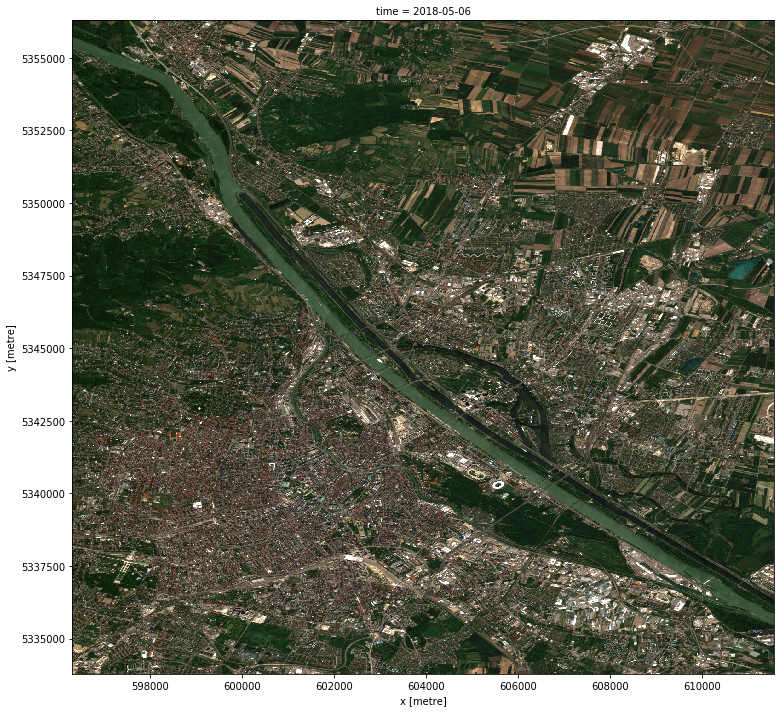

In [8]:
plot_bands(data, 'B04', 'B03', 'B02', fake_saturation=3000)

### False color Infrared

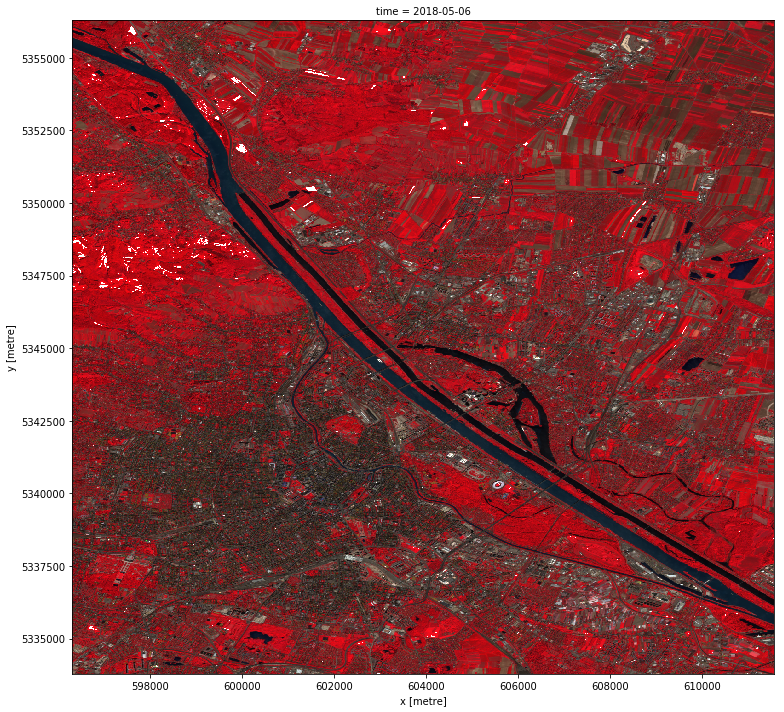

In [9]:
plot_bands(data, 'B08', 'B04', 'B03', fake_saturation=5700)

### False Color Urban

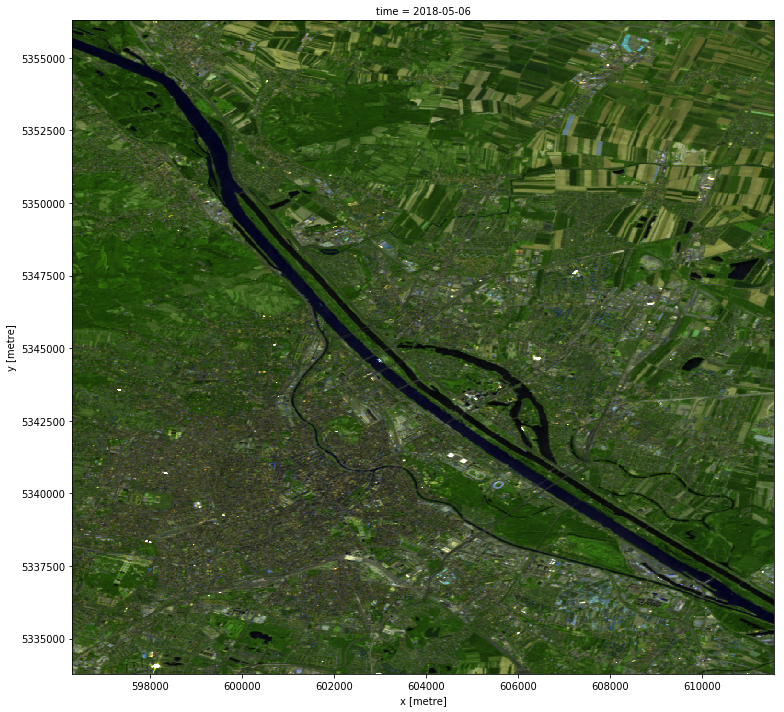

In [10]:
plot_bands(data, 'B12', 'B11', 'B04', fake_saturation=6000)

### Agriculture

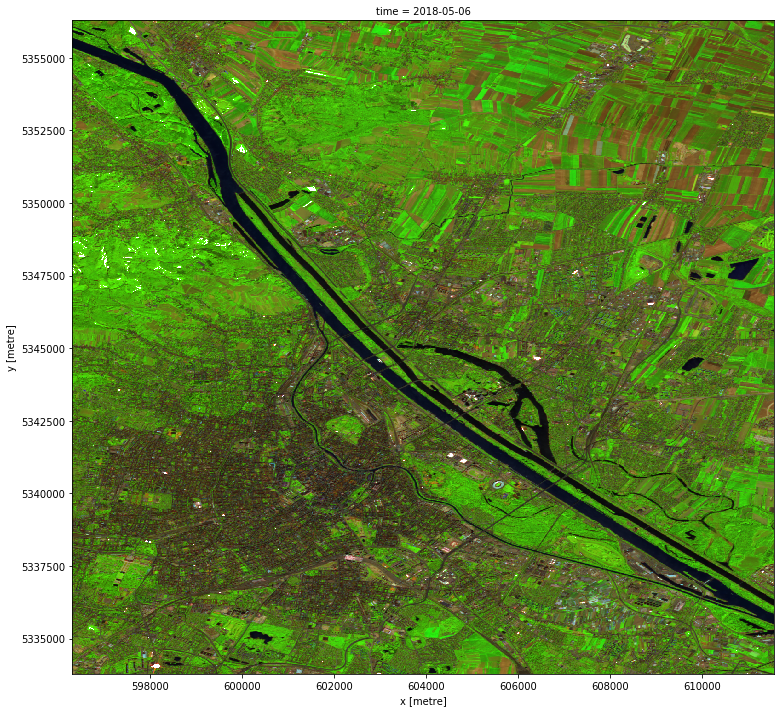

In [11]:
plot_bands(data, 'B11', 'B08', 'B02', fake_saturation=6000)

### Atmospheric penetration

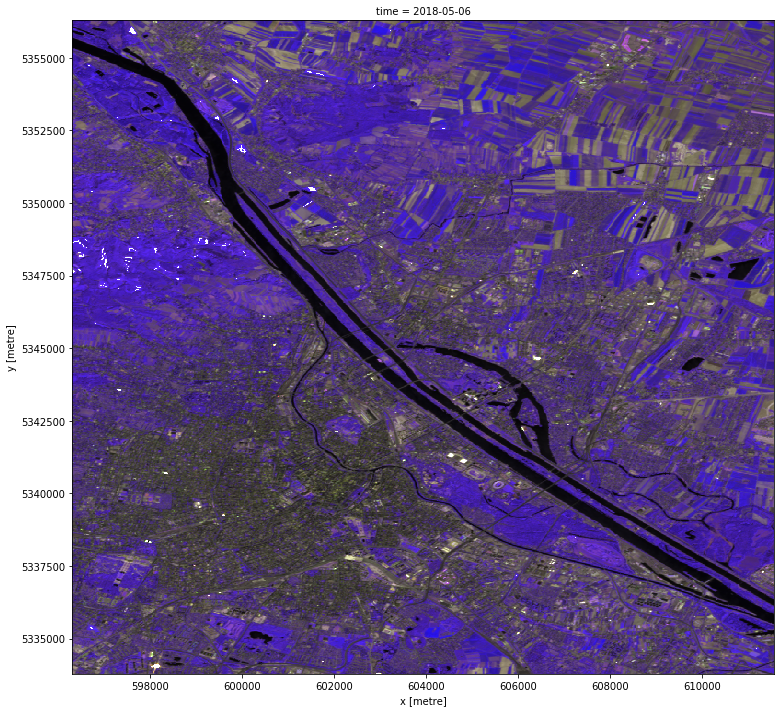

In [12]:
plot_bands(data, 'B11', 'B12', 'B8A', fake_saturation=6000)

### Healthy Vegetation

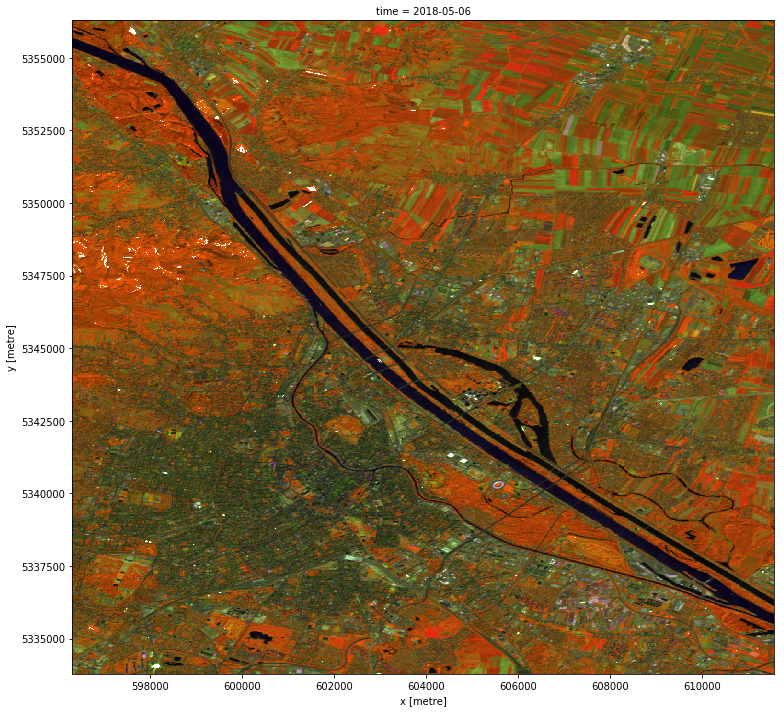

In [13]:
plot_bands(data, 'B08', 'B11', 'B02', fake_saturation=6000)

### Land/Water

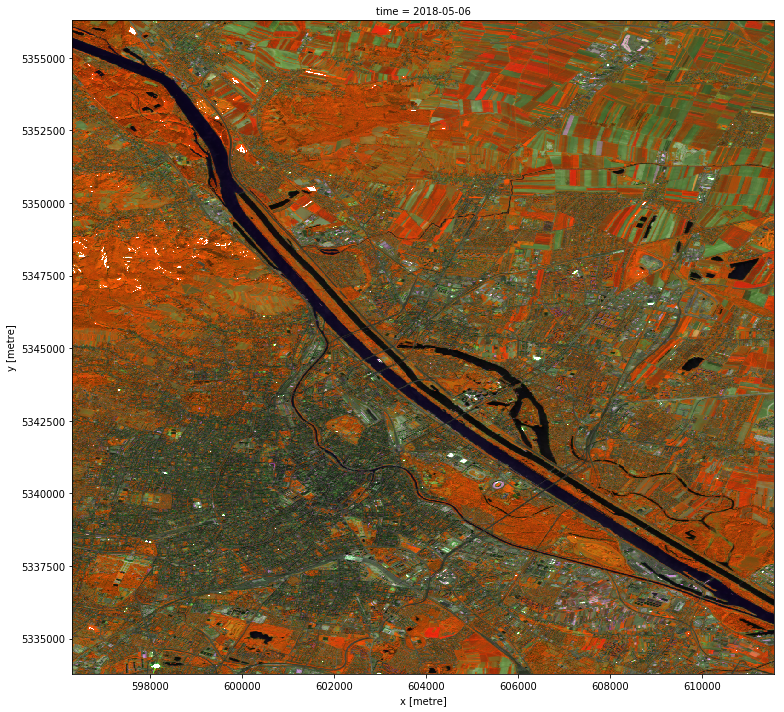

In [14]:
plot_bands(data, 'B08', 'B11', 'B04', fake_saturation=6000)

### Natural Colors with Atmospheric Removal

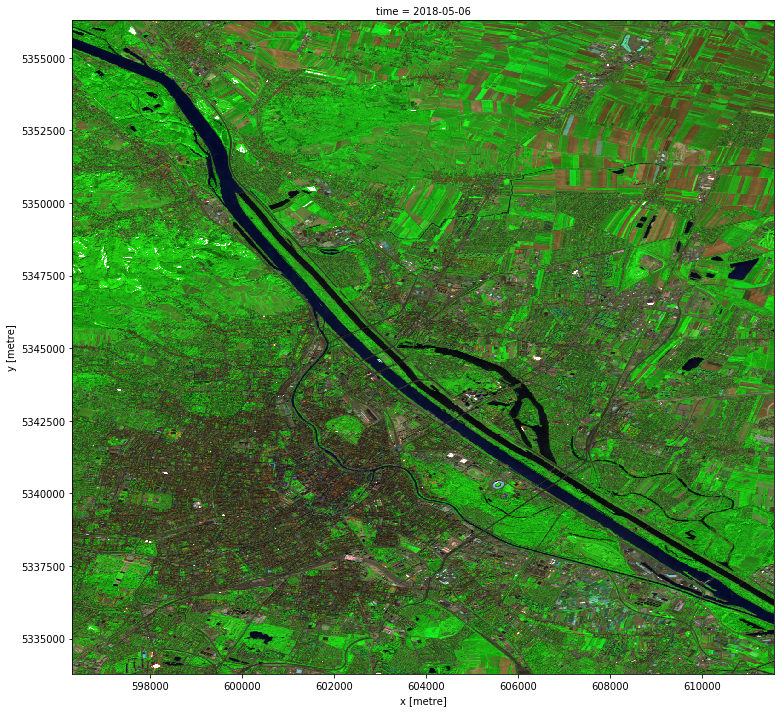

In [15]:
plot_bands(data, 'B12', 'B08', 'B03', fake_saturation=6000)

### Shortwave Infrared

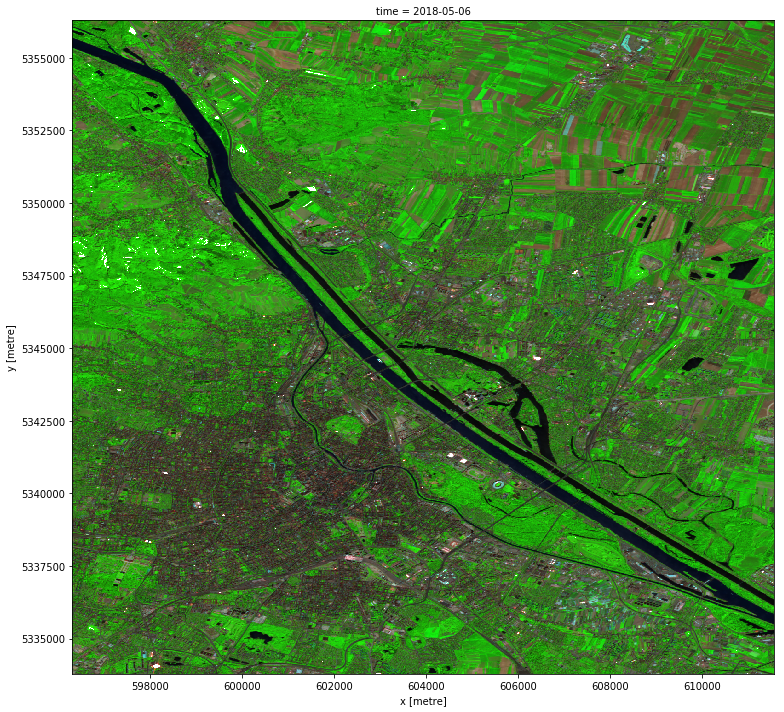

In [16]:
plot_bands(data, 'B12', 'B08', 'B04', fake_saturation=6000)

### Vegetation Analysis

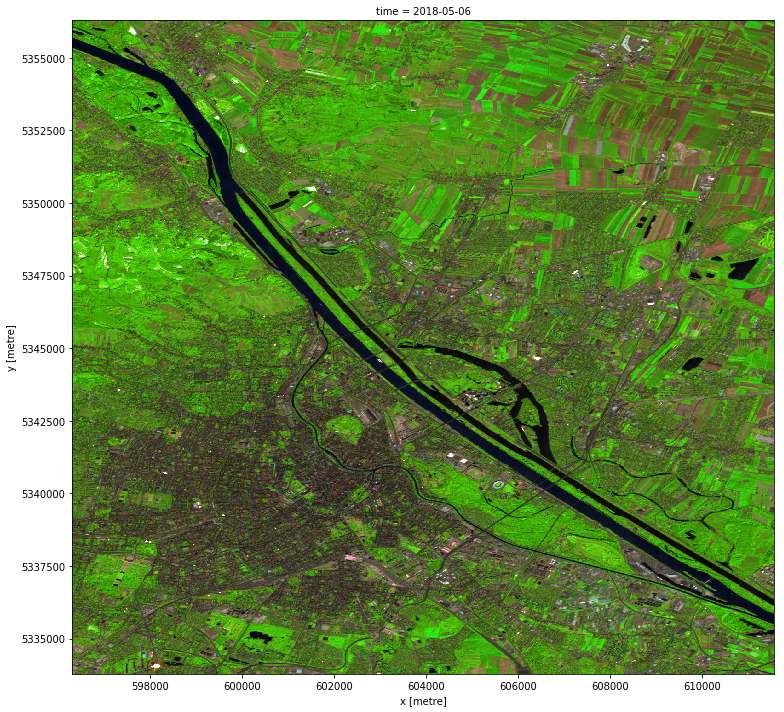

In [17]:
plot_bands(data, 'B11', 'B08', 'B04', fake_saturation=6000)

### Geology 

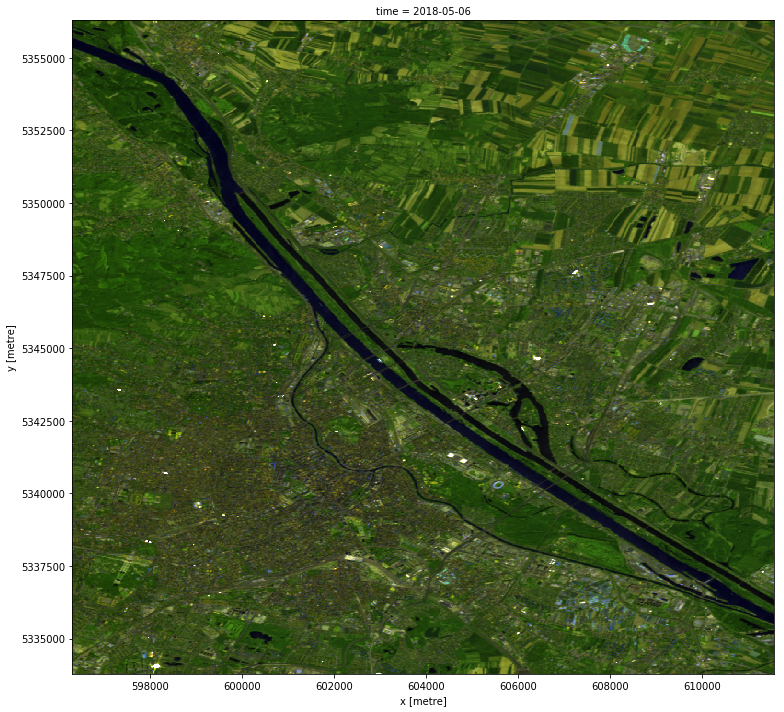

In [18]:
plot_bands(data, 'B12', 'B11', 'B02', fake_saturation=6000)